## Load and Visualize the Data

In [8]:
import os
import shutil
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms
import numpy as np
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset
import cv2

In [9]:
import pandas as pd
df = pd.read_csv('/kaggle/input/celeba-dataset/list_attr_celeba.csv')
imgs = df.to_numpy()

In [70]:
!mkdir wwg

In [78]:
df.columns

Index(['image_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair',
       'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings',
       'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace',
       'Wearing_Necktie', 'Young'],
      dtype='object')

In [18]:
# Men without glasses
for example in imgs:
    if example[21] == 1 and example[16]==-1:
        shutil.copy('/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/' + example[0], '/kaggle/working/mwog')

In [19]:
# Men with glasses
for example in imgs:
    if example[21] == 1 and example[16]==1:
        shutil.copy('/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/' + example[0], '/kaggle/working/mwg')

In [71]:
for example in imgs:
    if example[21] == -1 and example[16]==1:
        shutil.copy('/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/' + example[0], '/kaggle/working/wwg')

In [21]:
len(os.listdir('/kaggle/working/mwg'))

10478

In [72]:
data_dir='../input/gan-getting-started'
class GANdataGenerator(Dataset):
    def __init__(self,data_dir ,  data_files , image_size ):
        super(GANdataGenerator , self).__init__()
        self.data_dir = data_dir
        self.data = data_files
        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor()
        ])
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        data_file = self.data[index]
        data_file = os.path.join(self.data_dir , data_file)
        img_bgr = cv2.imread(data_file)
        img_rgb = cv2.cvtColor(img_bgr , cv2.COLOR_BGR2RGB)
        img_tensor = self.transform(img_rgb)
        
        return img_tensor

In [73]:
mwg = os.listdir('/kaggle/working/mwg')
wwg = os.listdir('/kaggle/working/wwg')

In [74]:
#load the Dataloader for X and Y image sets
X_type='men_with_glasses'
Y_type='woman_with_glasses'
X_set = GANdataGenerator(data_dir='/kaggle/working/mwg' , data_files=mwg , image_size=128 )
Y_set = GANdataGenerator(data_dir='/kaggle/working/wwg' , data_files=wwg , image_size=128 )

X_dataloader = DataLoader(X_set , batch_size=16 , shuffle=True , num_workers=0)
Y_dataloader = DataLoader(Y_set , batch_size=16 , shuffle=True , num_workers=0)

In [75]:
x_data = next(iter(X_dataloader))
y_data = next(iter(Y_dataloader))

# Visualize the data

X Data Visualization


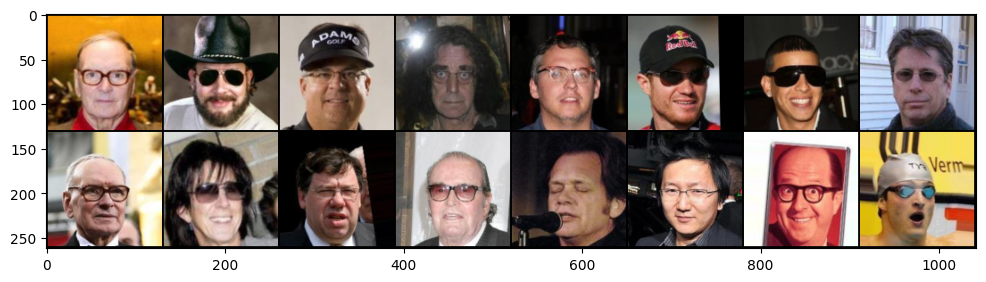

In [76]:
import matplotlib.pyplot as plt
print("X Data Visualization")
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(x_data))

Y data Visualization


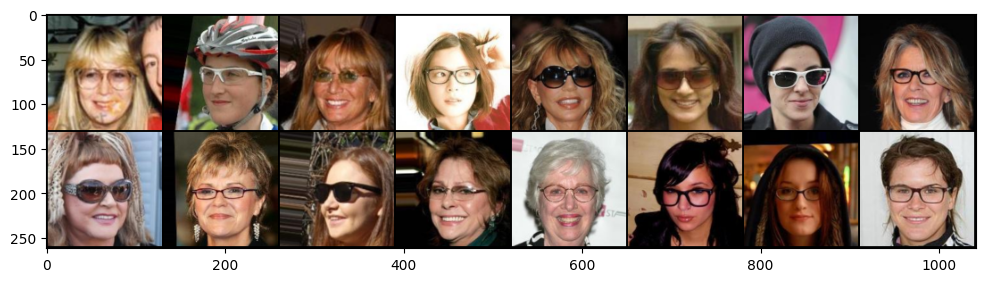

In [77]:
print("Y data Visualization")
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(y_data))

In [79]:
import matplotlib.pyplot as plt
def viz_sample(samples_x , samples_y):
    #get random sample from the x and y
    #plot the sample
    plt.title("Real sample")
    plt.imshow(samples_x)
    plt.show()
    plt.title("Fake sample")
    plt.imshow(samples_y)
    plt.show()

In [80]:
img = x_data[0]

print("Min : ",img.min())
print("Max : ",img.max())

def rescale(x , feature_range=(-1,1)):
    min , max = feature_range
    x = x*(max - min) +min
    
    return x

Min :  tensor(0.)
Max :  tensor(1.)


In [81]:
# scaled range
scaled_img = rescale(img)

print('Scaled min: ', scaled_img.min())
print('Scaled max: ', scaled_img.max())

Scaled min:  tensor(-1.)
Scaled max:  tensor(1.)


In [82]:
import torch.nn as nn
import torch.nn.functional as F

#define the conv block for discriminator
def conv_block(in_channels , out_channels , kernel_size=4 , strides=2 ,padding_type='reflect' , padding=1 , batch_norm=True):
    layers = []
    if(padding_type=='reflect'):
        pad = nn.ReflectionPad2d(padding)
        layers.append(pad)
        
    if(padding_type=='replicate'):
        pad = nn.ReplicationPad2d(padding)
        layers.append(pad)
        
        
    conv_layer = nn.Conv2d(in_channels=in_channels , out_channels=out_channels , 
                          kernel_size=kernel_size , stride=strides , padding=0 ,  bias=False)
    layers.append(conv_layer)
    if(batch_norm):
        bn = nn.InstanceNorm2d(out_channels)
        layers.append(bn)
        
    return nn.Sequential(*layers)

In [83]:
class Discriminator(nn.Module):
    
    def __init__(self , conv_dim , padding_mode):
        super(Discriminator , self).__init__()
        """
        Define the discriminator model to classify the images as real or fake
        in_channels =3
        out_channels=1
        """
        self.input_channels = 3
        self.output_channels = 1
        self.padding_mode = padding_mode
        # 256 - 256 -3 --> 128 - 128 -64
        self.conv_block1 = conv_block(self.input_channels , conv_dim  , padding_type=padding_mode)
        # 128 - 128 - 64 --> 64 - 64 - 128
        self.conv_block2 = conv_block(conv_dim , conv_dim*2 , padding_type=padding_mode)
        # 64 - 64 - 128 --> 32 - 32 - 256
        self.conv_block3 = conv_block(conv_dim*2 , conv_dim*4 , padding_type=padding_mode )
        # 32 - 32 - 256 --> 16 - 16 - 512
        self.conv_block4 = conv_block(conv_dim*4 , conv_dim*8 , padding_type=padding_mode)
        # 16 - 16 - 512 --> 8 - 8 - 1024
        self.conv_block5 = conv_block(conv_dim*8 , self.output_channels , kernel_size=1 ,
                                      strides=1 ,padding_type=None ,  padding=0 , batch_norm=False)
        self.leaky_relu = nn.LeakyReLU(negative_slope=0.2, inplace=True)
        
    def forward(self , x):
        x = self.leaky_relu(self.conv_block1(x))
        x = self.leaky_relu(self.conv_block2(x))
        x = self.leaky_relu(self.conv_block3(x))
        x = self.leaky_relu(self.conv_block4(x))
        
        out = self.conv_block5(x)
        
        return out
        

In [84]:
#define the discriminator network with encoder - resblock - decoder
class ResidualBlock(nn.Module):
    def __init__(self , conv_dim , padding_mode):
        super(ResidualBlock , self).__init__()
        self.conv_dim = conv_dim
        self.conv_block1 = conv_block(self.conv_dim , self.conv_dim , kernel_size=3 ,
                                      strides=1 ,padding_type=padding_mode , padding=1 , batch_norm=True)
        
        self.conv_block2 = conv_block(self.conv_dim , self.conv_dim , kernel_size=3 ,
                                      strides=1 ,padding_type=padding_mode, padding=1 , batch_norm=True)
        
        self.dropout = nn.Dropout(p=0.3)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self , x):
        res_1 = self.dropout(self.relu(self.conv_block1(x)))
        res_2 = self.conv_block2(res_1)
        out  = self.relu(res_2 + x)
        
        return out

In [85]:
def deconv_block(in_channels , out_channels , kernel_size=4 , strides=2 , padding=1 , batch_norm=True):
    layers = []        
    deconv_layer = nn.ConvTranspose2d(in_channels=in_channels , out_channels=out_channels ,
                                      kernel_size=kernel_size , stride=strides , padding=padding , bias=False)
    layers.append(deconv_layer)
    if(batch_norm):
        bn = nn.InstanceNorm2d(out_channels)
        layers.append(bn)
        
    return nn.Sequential(*layers)

In [86]:
class CycleGenerator(nn.Module):
    def __init__(self , conv_dim , n_resblocks , padding_mode):
        super(CycleGenerator , self).__init__()
        self.conv_dim = conv_dim
        self.n_resblocks = n_resblocks
        self.in_channels = 3
        self.out_channels = 3
        self.encoder = nn.Sequential(
            conv_block(self.in_channels , conv_dim , padding_type=padding_mode) ,
            nn.ReLU(True),
            conv_block(conv_dim , conv_dim*2 , padding_type=padding_mode), 
            nn.ReLU(True),
            conv_block(conv_dim*2 , conv_dim*4 , padding_type=padding_mode),
            nn.ReLU(True)
        )
        layers = []
        for i_res in range(self.n_resblocks):
            layers.append(ResidualBlock(conv_dim*4 , padding_mode=padding_mode))
        self.res_block = nn.Sequential(*layers)
        
        self.decoder =nn.Sequential(
            deconv_block(conv_dim*4 , conv_dim*2 ),
            nn.ReLU(True),
            deconv_block(conv_dim*2, conv_dim ),
            nn.ReLU(True),
            deconv_block(conv_dim , self.out_channels , batch_norm=False),
            nn.Tanh()
        )
    def forward(self, x):
        #inference throght the encoder
        x = self.encoder(x)
        x = self.res_block(x)
        x = self.decoder(x)
        
        return x

In [87]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if(classname.find('Conv') != -1):
        torch.nn.init.normal(m.weight.data , 0.0 , 0.02)
    elif(classname.find('Batchnorm2d')!= -1):
        torch.nn.init.normal(m.weight.data , 0.0 , 0.02)
        torch.nn.init.constant(m.bias.data , 0.0)

In [88]:
def create_model(g_conv_dim=64 , d_conv_dim=64 , n_resblocks = 9 , padding_mode='reflect'):
    G_X2Y = CycleGenerator(g_conv_dim ,n_resblocks , padding_mode)
    G_Y2X = CycleGenerator(g_conv_dim ,n_resblocks , padding_mode)
    
    D_X = Discriminator(d_conv_dim  ,padding_mode)
    D_Y = Discriminator(d_conv_dim , padding_mode)
    
    G_X2Y.apply(weights_init_normal)
    G_Y2X.apply(weights_init_normal)
    D_X.apply(weights_init_normal)
    D_Y.apply(weights_init_normal)
    
    device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
    #move the models to gpu if availabele
    G_X2Y.to(device)
    G_Y2X.to(device)
    D_X.to(device)
    D_Y.to(device)
    
    return G_X2Y , G_Y2X , D_X , D_Y

In [89]:
G_X2Y , G_Y2X , D_X , D_Y = create_model(padding_mode='replicate')

In [90]:
criterion_Idt = nn.L1Loss()
#define loss functions which are helpful
def real_mse_loss(D_out):
    # how close is the produced output from being "real"?
    return torch.mean((D_out -1)**2)

def fake_mse_loss(D_out):
    # how close is the produced output from being "false"?
    return torch.mean(D_out**2)
    

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight):
    # calculate reconstruction loss 
    # return weighted loss
    reconstruct_loss = torch.mean(torch.abs(real_im-reconstructed_im))
    return reconstruct_loss*lambda_weight

def identity_loss(lambda_idt , idt_B ,real_B , idt_A , real_A , lambda_weight):
    
    if lambda_idt > 0:
        # G_A should be identity if real_B is fed: ||G_A(B) - B||
        loss_idt_A = criterion_Idt(idt_B, real_B) * lambda_weight * lambda_idt
        # G_B should be identity if real_A is fed: ||G_B(A) - A||
        loss_idt_B = criterion_Idt(idt_A, real_A) * lambda_weight * lambda_idt
    else:
        self.loss_idt_A = 0
        self.loss_idt_B = 0
        
    return loss_idt_A + loss_idt_B

In [91]:
#define the optimizers
import torch.optim as optim
from torch.optim.lr_scheduler import MultiStepLR

# hyperparams for Adam optimizers
lr=0.0002
beta1=0.5
beta2= 0.999

g_params = list(G_X2Y.parameters()) + list(G_Y2X.parameters())  # Get generator parameters

# Create optimizers for the generators and discriminators
g_optimizer   = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

lambda1 = 3500
lambda2 = 8500

#define lr scheduler
#g_lr_scheduler = MultiStepLR(g_optimizer, milestones=[lambda1,lambda2], gamma=0.1)
#dx_lr_scheduler =MultiStepLR(d_x_optimizer, milestones=[lambda1,lambda2], gamma=0.1)
#dy_lr_scheduler = MultiStepLR(d_y_optimizer, milestones=[lambda1,lambda2], gamma=0.1)

In [92]:
# train the network
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X , test_dataloader_Y, 
                  n_epochs=10000):
    
    print_every=50
    checkpoint_every=1000
    # keep track of losses over time
    losses = []

    test_iter_X = iter(dataloader_X)
    test_iter_Y = iter(dataloader_Y)

    # Get some fixed data from domains X and Y for sampling. These are images that are held
    # constant throughout training, that allow us to inspect the model's performance.
    fixed_X = next(test_iter_X)[0]
    fixed_Y = next(test_iter_Y)[0]
    fixed_X = rescale(fixed_X) # make sure to scale to a range -1 to 1
    fixed_Y = rescale(fixed_Y)

    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    for epoch in range(1, n_epochs+1):
        
        
        # Reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        images_X = next(iter_X)
        images_X = rescale(images_X) # make sure to scale to a range -1 to 1

        images_Y = next(iter_Y)
        images_Y = rescale(images_Y)
        
        # move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)


        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================

        ##   First: D_X, real and fake loss components   ##

        # 1. Compute the discriminator losses on real images in X domain
        Dx_real_out = D_X(images_X)
        Dx_real_loss = real_mse_loss(Dx_real_out)
        
        # 2. Generate fake images that look like domain X based on real images in domain Y
        Gx_fake = G_Y2X(images_Y)
        
        # 3. Compute the fake loss for D_X on fake X
        Dx_fake_out= D_X(Gx_fake)
        Dx_fake_loss = fake_mse_loss(Dx_fake_out)
        
        # 4. Compute the total loss and perform backprop
        d_x_loss = Dx_real_loss + Dx_fake_loss
        #reste the optimizer
        d_x_optimizer.zero_grad()
        #backprop the loss
        d_x_loss.backward()
        #optimze the descrimintaer x
        d_x_optimizer.step()

        
        ##   Second: D_Y, real and fake loss components   ##
        Dy_real_out = D_Y(images_Y)
        Dy_real_loss = real_mse_loss(Dy_real_out)
        
        #generate fake images looks like the domain y on the real images in domain x
        Gy_fake = G_X2Y(images_X)
        
        #compute the descreminter fake loss
        Dy_fake_out = D_Y(Gy_fake)
        Dy_fake_loss = fake_mse_loss(Dy_fake_out)
        
        d_y_loss = Dy_fake_loss + Dy_real_loss
        #reset the optimizer
        d_y_optimizer.zero_grad()
        #backprop the loss
        d_y_loss.backward()
        #optimize the model
        d_y_optimizer.step()
        


        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================

        ##    First: generate fake X images and reconstructed Y images    ##

        # 1. Generate fake images that look like domain X based on real images in domain Y
        Gx_fake = G_Y2X(images_Y)

        # 2. Compute the generator loss based on domain X
        Dx_fake_out = D_X(Gx_fake)
        Gx_fake_loss = real_mse_loss(Dx_fake_out)

        # 3. Create a reconstructed y
        Gy_fake_re =  G_X2Y(Gx_fake) 
        
        # 4. Compute the cycle consistency loss (the reconstruction loss)
        Gy_reconstruct_loss = cycle_consistency_loss(images_Y , Gy_fake_re , lambda_weight=10)

        ##    Second: generate fake Y images and reconstructed X images    ##
        Gy_fake = G_X2Y(images_X)
        
        #compute the generator fake loss on descriminator
        Dy_fake_out = D_Y(Gy_fake)
        Gy_fake_loss = real_mse_loss(Dy_fake_out)
        
        #regenerate the x images from fake y domain images
        Gx_fake_re = G_Y2X(Gy_fake)
        
        #compute the cycle consistnace loss on the real x and reconstructed x images
        Gx_reconstuct_loss = cycle_consistency_loss(images_X , Gx_fake_re , lambda_weight=10)
        
        #compute the identity loss
        idt_B = G_X2Y(images_Y)
        idt_A = G_Y2X(images_X)
        id_loss = identity_loss(0.1 , idt_B , images_Y ,
                                idt_A , images_X , lambda_weight=8)

        # 5. Add up all generator and reconstructed losses and perform backprop
        g_total_loss = Gx_fake_loss + Gy_fake_loss + Gy_reconstruct_loss + Gx_reconstuct_loss + id_loss
        
        #optimize the generator model
        g_optimizer.zero_grad()
        #back prop the loss
        g_total_loss.backward()
        #optimize the generator model
        g_optimizer.step()

        
        # Print the log info
        if epoch % print_every == 0:
            # append real and fake discriminator losses and the generator loss
            losses.append((d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))
            print('Epoch [{:5d}/{:5d}] | d_X_loss: {:6.4f} | d_Y_loss: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    epoch, n_epochs, d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))

            
        sample_every=1000
        if epoch % sample_every == 0:
            G_Y2X.eval() 
            G_X2Y.eval()
            save_samples(epoch, fixed_Y, fixed_X, G_Y2X, G_X2Y, batch_size=16)
            G_Y2X.train()
            G_X2Y.train()

    return losses


## Helper functions

In [93]:
import os
import pdb
import pickle
import argparse

import warnings
warnings.filterwarnings("ignore")


import torch


import numpy as np
import scipy
import scipy.misc


def checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y, checkpoint_dir='checkpoints_cyclegan'):
    G_XtoY_path = os.path.join(checkpoint_dir, 'G_XtoY.pkl')
    G_YtoX_path = os.path.join(checkpoint_dir, 'G_YtoX.pkl')
    D_X_path = os.path.join(checkpoint_dir, 'D_X.pkl')
    D_Y_path = os.path.join(checkpoint_dir, 'D_Y.pkl')
    torch.save(G_XtoY.state_dict(), G_XtoY_path)
    torch.save(G_YtoX.state_dict(), G_YtoX_path)
    torch.save(D_X.state_dict(), D_X_path)
    torch.save(D_Y.state_dict(), D_Y_path)


def merge_images(sources, targets, batch_size=16):
    _, _, h, w = sources.shape
    row = int(np.sqrt(batch_size))
    merged = np.zeros([3, row*h, row*w*2])
    for idx, (s, t) in enumerate(zip(sources, targets)):
        i = idx // row
        j = idx % row
        merged[:, i*h:(i+1)*h, (j*2)*h:(j*2+1)*h] = s
        merged[:, i*h:(i+1)*h, (j*2+1)*h:(j*2+2)*h] = t
    merged = merged.transpose(1, 2, 0)
    return merged
    

def to_data(x):
    """Converts variable to numpy."""
    if torch.cuda.is_available():
        x = x.cpu()
    x = x.squeeze(0)
    x = x.data.numpy()
    x = np.transpose(x,(1,2,0))
    x = ((x +1)*255 / (2)).astype(np.uint8) # rescale to 0-255
    return x

def save_samples(iteration, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16, sample_dir='samples_cyclegan'):
    """Saves samples from both generators X->Y and Y->X.
        """
    # move input data to correct device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    fake_X = G_YtoX(fixed_Y.unsqueeze(0).to(device))
    fake_Y = G_XtoY(fixed_X.unsqueeze(0).to(device))
    
    X, fake_X = to_data(fixed_X), to_data(fake_X)
    Y, fake_Y = to_data(fixed_Y), to_data(fake_Y)
    
    viz_sample(X,fake_Y)

Epoch [   50/10000] | d_X_loss: 0.4665 | d_Y_loss: 0.4741 | g_total_loss: 7.7697
Epoch [  100/10000] | d_X_loss: 0.4450 | d_Y_loss: 0.4527 | g_total_loss: 6.5372
Epoch [  150/10000] | d_X_loss: 0.4521 | d_Y_loss: 0.4377 | g_total_loss: 6.0108
Epoch [  200/10000] | d_X_loss: 0.5105 | d_Y_loss: 0.4172 | g_total_loss: 5.9281
Epoch [  250/10000] | d_X_loss: 0.4941 | d_Y_loss: 0.5081 | g_total_loss: 5.3815
Epoch [  300/10000] | d_X_loss: 0.4739 | d_Y_loss: 0.4858 | g_total_loss: 4.6844
Epoch [  350/10000] | d_X_loss: 0.4490 | d_Y_loss: 0.4450 | g_total_loss: 4.9448
Epoch [  400/10000] | d_X_loss: 0.4412 | d_Y_loss: 0.4653 | g_total_loss: 4.8609
Epoch [  450/10000] | d_X_loss: 0.4110 | d_Y_loss: 0.4521 | g_total_loss: 4.6355
Epoch [  500/10000] | d_X_loss: 0.4207 | d_Y_loss: 0.4437 | g_total_loss: 4.5762
Epoch [  550/10000] | d_X_loss: 0.3970 | d_Y_loss: 0.5396 | g_total_loss: 5.5130
Epoch [  600/10000] | d_X_loss: 0.4024 | d_Y_loss: 0.3879 | g_total_loss: 4.6840
Epoch [  650/10000] | d_X_lo

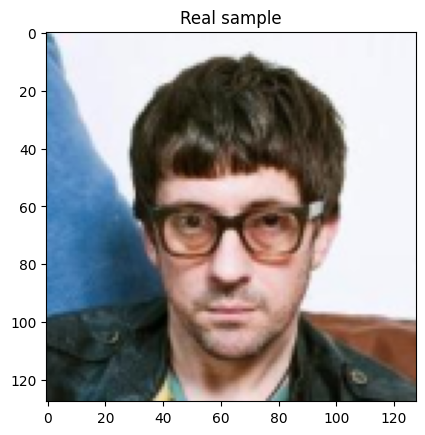

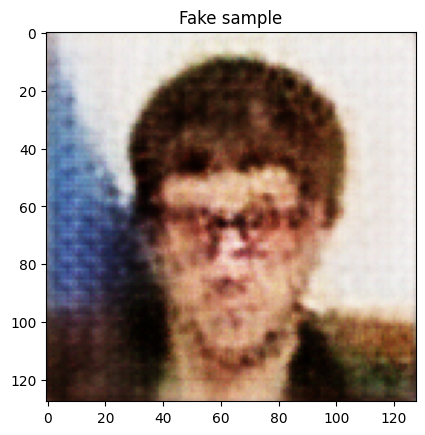

Epoch [ 1050/10000] | d_X_loss: 0.4589 | d_Y_loss: 0.4696 | g_total_loss: 4.4282
Epoch [ 1100/10000] | d_X_loss: 0.3984 | d_Y_loss: 0.3931 | g_total_loss: 4.3451
Epoch [ 1150/10000] | d_X_loss: 0.3742 | d_Y_loss: 0.4404 | g_total_loss: 4.2673
Epoch [ 1200/10000] | d_X_loss: 0.4465 | d_Y_loss: 0.3860 | g_total_loss: 4.7873
Epoch [ 1250/10000] | d_X_loss: 0.4054 | d_Y_loss: 0.4655 | g_total_loss: 3.9438
Epoch [ 1300/10000] | d_X_loss: 0.4263 | d_Y_loss: 0.4417 | g_total_loss: 4.2799
Epoch [ 1350/10000] | d_X_loss: 0.4315 | d_Y_loss: 0.4434 | g_total_loss: 4.2582
Epoch [ 1400/10000] | d_X_loss: 0.4530 | d_Y_loss: 0.3864 | g_total_loss: 4.0546
Epoch [ 1450/10000] | d_X_loss: 0.4314 | d_Y_loss: 0.4495 | g_total_loss: 4.3213
Epoch [ 1500/10000] | d_X_loss: 0.4401 | d_Y_loss: 0.4040 | g_total_loss: 3.9151
Epoch [ 1550/10000] | d_X_loss: 0.4322 | d_Y_loss: 0.4222 | g_total_loss: 4.0232
Epoch [ 1600/10000] | d_X_loss: 0.4127 | d_Y_loss: 0.3971 | g_total_loss: 3.8340
Epoch [ 1650/10000] | d_X_lo

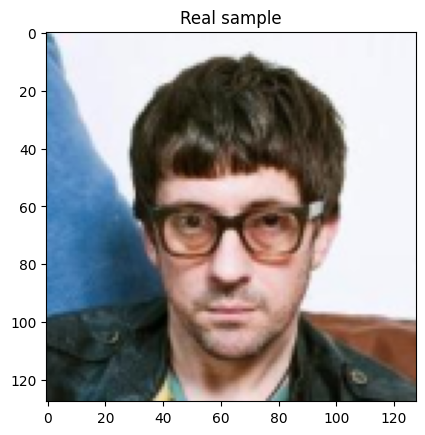

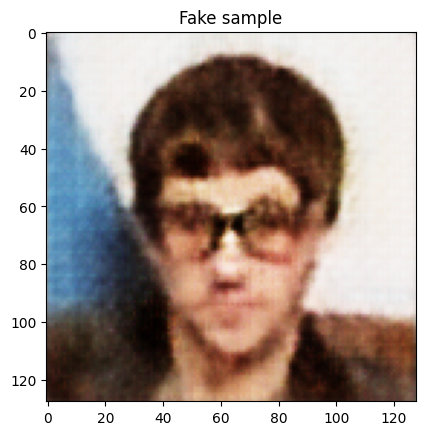

Epoch [ 2050/10000] | d_X_loss: 0.4196 | d_Y_loss: 0.3989 | g_total_loss: 3.5888
Epoch [ 2100/10000] | d_X_loss: 0.4279 | d_Y_loss: 0.3879 | g_total_loss: 3.6967
Epoch [ 2150/10000] | d_X_loss: 0.4409 | d_Y_loss: 0.4059 | g_total_loss: 4.2361
Epoch [ 2200/10000] | d_X_loss: 0.4581 | d_Y_loss: 0.3784 | g_total_loss: 3.7344
Epoch [ 2250/10000] | d_X_loss: 0.6400 | d_Y_loss: 0.3989 | g_total_loss: 3.9864
Epoch [ 2300/10000] | d_X_loss: 0.4119 | d_Y_loss: 0.4044 | g_total_loss: 3.9657
Epoch [ 2350/10000] | d_X_loss: 0.3917 | d_Y_loss: 0.3548 | g_total_loss: 3.6004
Epoch [ 2400/10000] | d_X_loss: 0.3425 | d_Y_loss: 0.3386 | g_total_loss: 4.1685
Epoch [ 2450/10000] | d_X_loss: 0.3910 | d_Y_loss: 0.3811 | g_total_loss: 3.4880
Epoch [ 2500/10000] | d_X_loss: 0.4227 | d_Y_loss: 0.6196 | g_total_loss: 3.6851
Epoch [ 2550/10000] | d_X_loss: 0.4104 | d_Y_loss: 0.4620 | g_total_loss: 3.1104
Epoch [ 2600/10000] | d_X_loss: 0.3785 | d_Y_loss: 0.4269 | g_total_loss: 3.6280
Epoch [ 2650/10000] | d_X_lo

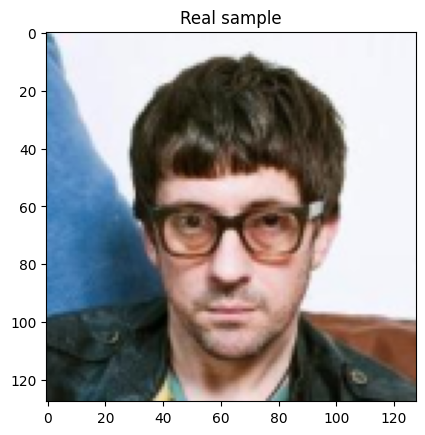

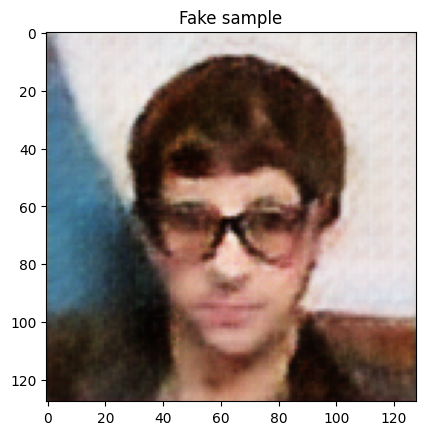

Epoch [ 3050/10000] | d_X_loss: 0.4036 | d_Y_loss: 0.3200 | g_total_loss: 3.7838
Epoch [ 3100/10000] | d_X_loss: 0.3961 | d_Y_loss: 0.3886 | g_total_loss: 3.7066
Epoch [ 3150/10000] | d_X_loss: 0.3870 | d_Y_loss: 0.4255 | g_total_loss: 4.3000
Epoch [ 3200/10000] | d_X_loss: 0.5683 | d_Y_loss: 0.4668 | g_total_loss: 3.7580
Epoch [ 3250/10000] | d_X_loss: 0.3636 | d_Y_loss: 0.5054 | g_total_loss: 3.1846
Epoch [ 3300/10000] | d_X_loss: 0.4740 | d_Y_loss: 0.4893 | g_total_loss: 3.7118
Epoch [ 3350/10000] | d_X_loss: 0.5561 | d_Y_loss: 0.4960 | g_total_loss: 3.2172
Epoch [ 3400/10000] | d_X_loss: 0.4466 | d_Y_loss: 0.5005 | g_total_loss: 2.9699
Epoch [ 3450/10000] | d_X_loss: 0.3707 | d_Y_loss: 0.4782 | g_total_loss: 3.3161
Epoch [ 3500/10000] | d_X_loss: 0.4861 | d_Y_loss: 0.4730 | g_total_loss: 3.0387
Epoch [ 3550/10000] | d_X_loss: 0.3769 | d_Y_loss: 0.4982 | g_total_loss: 3.1130
Epoch [ 3600/10000] | d_X_loss: 0.3470 | d_Y_loss: 0.4377 | g_total_loss: 3.5502
Epoch [ 3650/10000] | d_X_lo

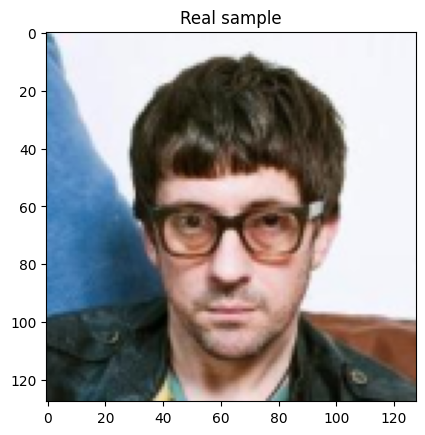

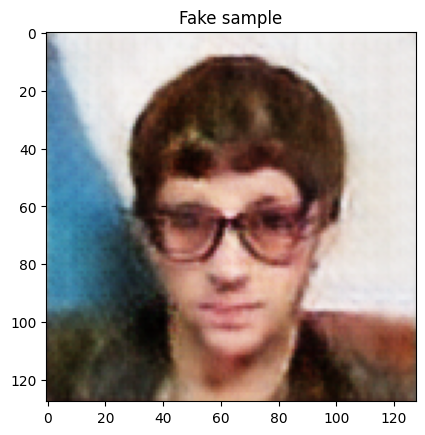

Epoch [ 4050/10000] | d_X_loss: 0.3394 | d_Y_loss: 0.4570 | g_total_loss: 3.1086
Epoch [ 4100/10000] | d_X_loss: 0.3720 | d_Y_loss: 0.3660 | g_total_loss: 3.3939
Epoch [ 4150/10000] | d_X_loss: 0.3909 | d_Y_loss: 0.3288 | g_total_loss: 3.4095
Epoch [ 4200/10000] | d_X_loss: 0.3659 | d_Y_loss: 0.3344 | g_total_loss: 3.4449
Epoch [ 4250/10000] | d_X_loss: 0.3800 | d_Y_loss: 0.3321 | g_total_loss: 3.7884
Epoch [ 4300/10000] | d_X_loss: 0.3795 | d_Y_loss: 0.3741 | g_total_loss: 3.6391
Epoch [ 4350/10000] | d_X_loss: 0.5000 | d_Y_loss: 0.3561 | g_total_loss: 3.7174
Epoch [ 4400/10000] | d_X_loss: 0.3324 | d_Y_loss: 0.4493 | g_total_loss: 3.6807
Epoch [ 4450/10000] | d_X_loss: 0.3774 | d_Y_loss: 0.3365 | g_total_loss: 3.3202
Epoch [ 4500/10000] | d_X_loss: 0.3613 | d_Y_loss: 0.3555 | g_total_loss: 3.2444
Epoch [ 4550/10000] | d_X_loss: 0.3252 | d_Y_loss: 0.2843 | g_total_loss: 3.3314
Epoch [ 4600/10000] | d_X_loss: 0.3914 | d_Y_loss: 0.5150 | g_total_loss: 3.2973
Epoch [ 4650/10000] | d_X_lo

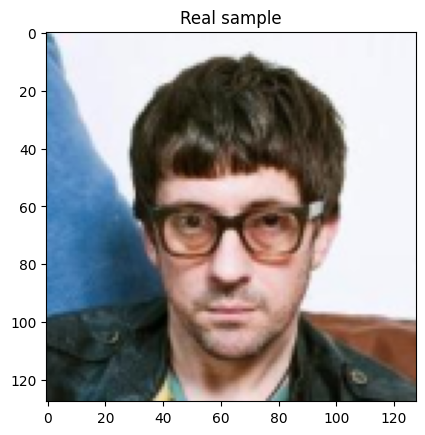

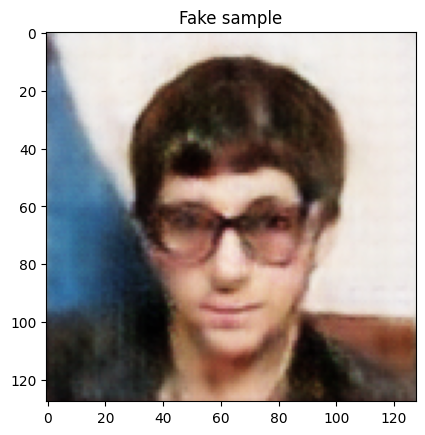

Epoch [ 5050/10000] | d_X_loss: 0.4561 | d_Y_loss: 0.4159 | g_total_loss: 2.9507
Epoch [ 5100/10000] | d_X_loss: 0.3900 | d_Y_loss: 0.3852 | g_total_loss: 3.3011
Epoch [ 5150/10000] | d_X_loss: 0.5229 | d_Y_loss: 0.5143 | g_total_loss: 3.1908
Epoch [ 5200/10000] | d_X_loss: 0.3904 | d_Y_loss: 0.5055 | g_total_loss: 3.3373
Epoch [ 5250/10000] | d_X_loss: 0.4906 | d_Y_loss: 0.5103 | g_total_loss: 2.9348
Epoch [ 5300/10000] | d_X_loss: 0.4758 | d_Y_loss: 0.5024 | g_total_loss: 2.5715
Epoch [ 5350/10000] | d_X_loss: 0.3546 | d_Y_loss: 0.4990 | g_total_loss: 3.0646
Epoch [ 5400/10000] | d_X_loss: 0.3743 | d_Y_loss: 0.4953 | g_total_loss: 2.9553
Epoch [ 5450/10000] | d_X_loss: 0.4874 | d_Y_loss: 0.5063 | g_total_loss: 3.5948
Epoch [ 5500/10000] | d_X_loss: 0.4421 | d_Y_loss: 0.5014 | g_total_loss: 2.8182
Epoch [ 5550/10000] | d_X_loss: 0.4137 | d_Y_loss: 0.5039 | g_total_loss: 3.1848
Epoch [ 5600/10000] | d_X_loss: 0.3341 | d_Y_loss: 0.4981 | g_total_loss: 2.9719
Epoch [ 5650/10000] | d_X_lo

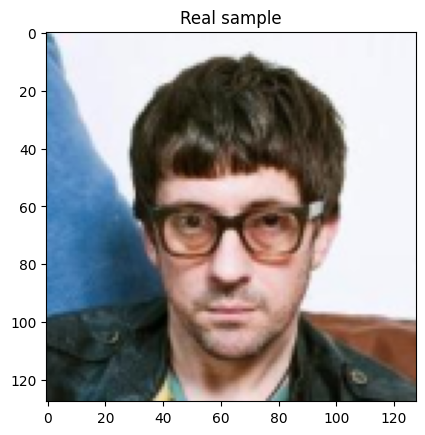

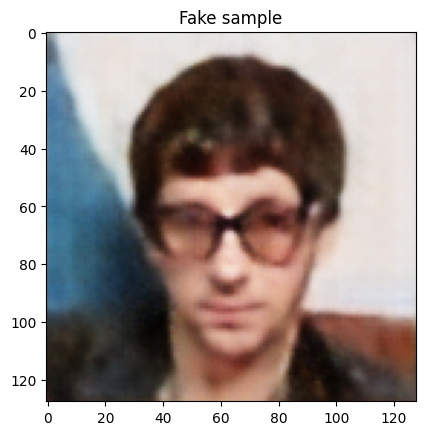

Epoch [ 6050/10000] | d_X_loss: 0.3202 | d_Y_loss: 0.4998 | g_total_loss: 3.0058
Epoch [ 6100/10000] | d_X_loss: 0.3162 | d_Y_loss: 0.4911 | g_total_loss: 3.1771
Epoch [ 6150/10000] | d_X_loss: 0.3126 | d_Y_loss: 0.4968 | g_total_loss: 2.8882
Epoch [ 6200/10000] | d_X_loss: 0.3735 | d_Y_loss: 0.5008 | g_total_loss: 2.9260
Epoch [ 6250/10000] | d_X_loss: 0.3610 | d_Y_loss: 0.4927 | g_total_loss: 2.9126
Epoch [ 6300/10000] | d_X_loss: 0.3406 | d_Y_loss: 0.5063 | g_total_loss: 2.8829
Epoch [ 6350/10000] | d_X_loss: 0.3924 | d_Y_loss: 0.5036 | g_total_loss: 3.1021
Epoch [ 6400/10000] | d_X_loss: 0.3167 | d_Y_loss: 0.4864 | g_total_loss: 3.2608
Epoch [ 6450/10000] | d_X_loss: 0.3673 | d_Y_loss: 0.4989 | g_total_loss: 2.9721
Epoch [ 6500/10000] | d_X_loss: 0.4885 | d_Y_loss: 0.4932 | g_total_loss: 2.7571
Epoch [ 6550/10000] | d_X_loss: 0.3322 | d_Y_loss: 0.4981 | g_total_loss: 2.9972
Epoch [ 6600/10000] | d_X_loss: 0.4682 | d_Y_loss: 0.4991 | g_total_loss: 2.9407
Epoch [ 6650/10000] | d_X_lo

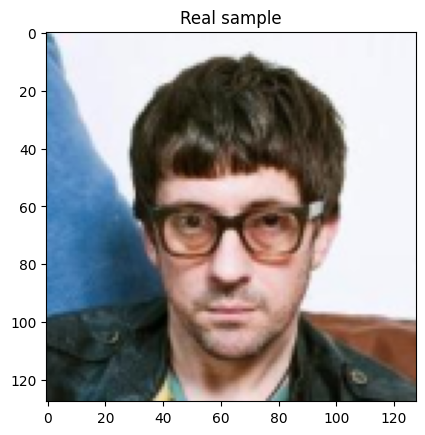

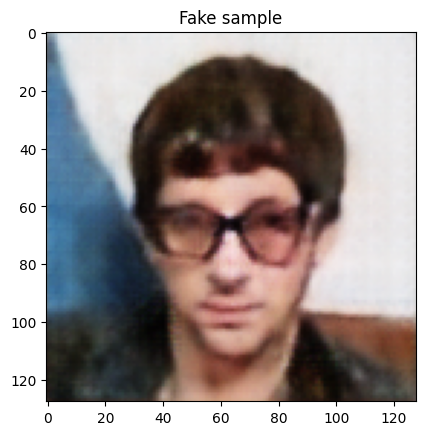

Epoch [ 7050/10000] | d_X_loss: 0.4972 | d_Y_loss: 0.4829 | g_total_loss: 2.7610
Epoch [ 7100/10000] | d_X_loss: 0.4299 | d_Y_loss: 0.4688 | g_total_loss: 3.0198
Epoch [ 7150/10000] | d_X_loss: 0.3447 | d_Y_loss: 0.4902 | g_total_loss: 2.8912
Epoch [ 7200/10000] | d_X_loss: 0.3566 | d_Y_loss: 0.4845 | g_total_loss: 3.0405
Epoch [ 7250/10000] | d_X_loss: 0.3678 | d_Y_loss: 0.4773 | g_total_loss: 3.0299
Epoch [ 7300/10000] | d_X_loss: 0.3816 | d_Y_loss: 0.4844 | g_total_loss: 3.3696
Epoch [ 7350/10000] | d_X_loss: 0.2976 | d_Y_loss: 0.4630 | g_total_loss: 2.8531
Epoch [ 7400/10000] | d_X_loss: 0.3469 | d_Y_loss: 0.4893 | g_total_loss: 2.7878
Epoch [ 7450/10000] | d_X_loss: 0.3167 | d_Y_loss: 0.4874 | g_total_loss: 2.9146
Epoch [ 7500/10000] | d_X_loss: 0.3042 | d_Y_loss: 0.4723 | g_total_loss: 2.9435
Epoch [ 7550/10000] | d_X_loss: 0.4037 | d_Y_loss: 0.4916 | g_total_loss: 2.9327
Epoch [ 7600/10000] | d_X_loss: 0.3284 | d_Y_loss: 0.4731 | g_total_loss: 3.2481
Epoch [ 7650/10000] | d_X_lo

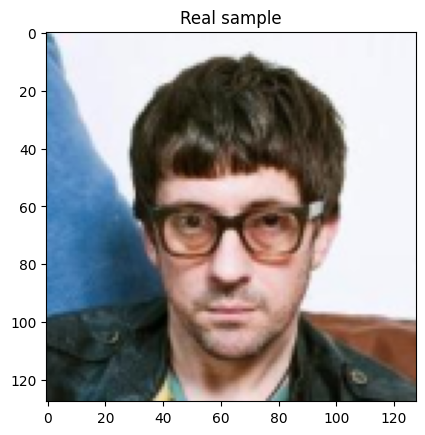

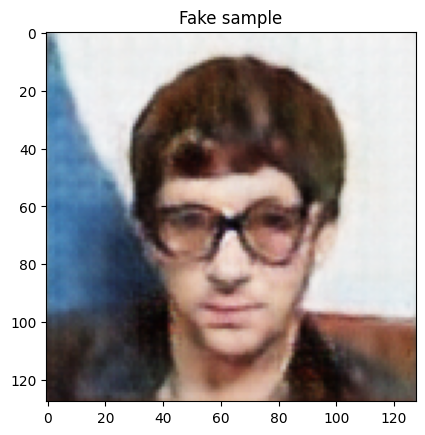

Epoch [ 8050/10000] | d_X_loss: 0.3158 | d_Y_loss: 0.4589 | g_total_loss: 3.1568


KeyboardInterrupt: 

In [94]:
n_epochs = 10000 # keep this small when testing if a model first works, then increase it to >=1000

losses = training_loop(X_dataloader, Y_dataloader, X_dataloader, Y_dataloader, n_epochs=n_epochs)

# Conversion Visualization

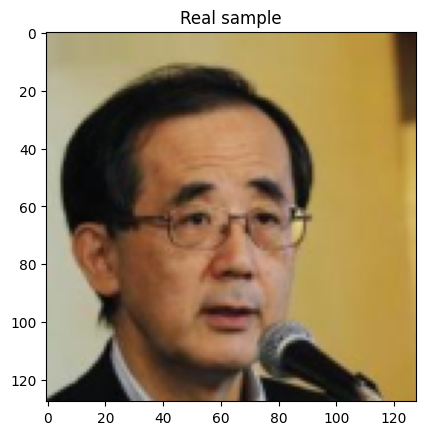

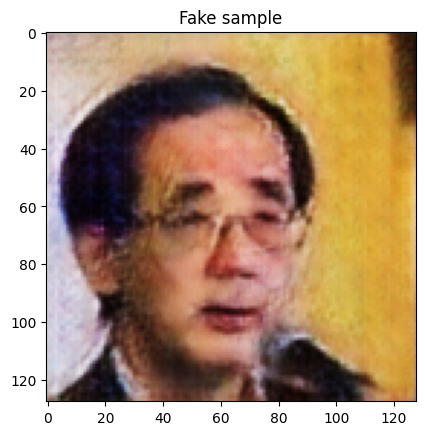

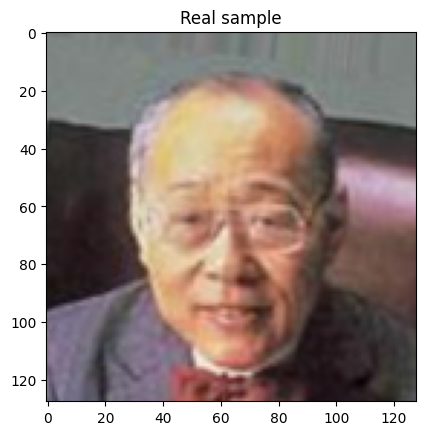

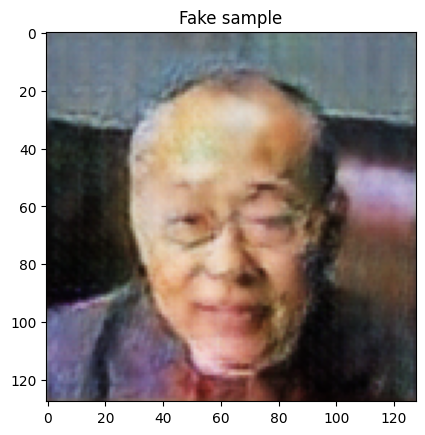

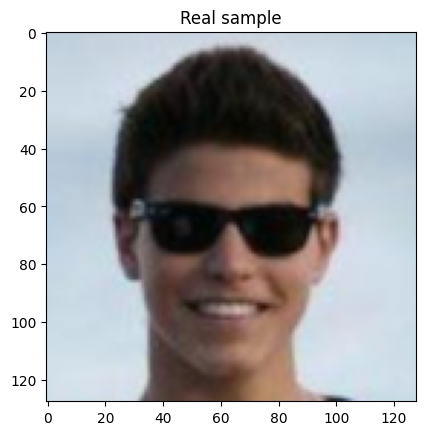

...

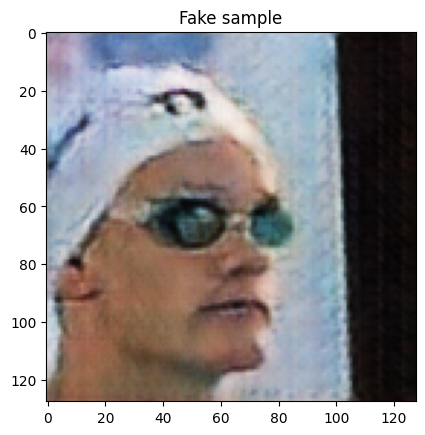

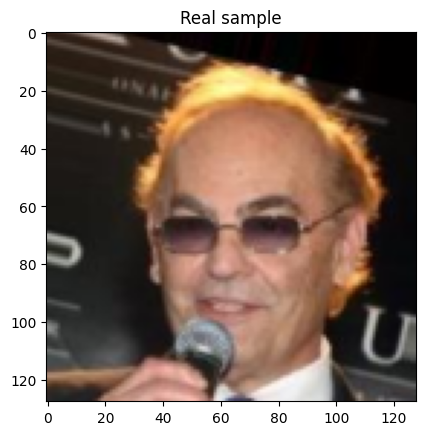

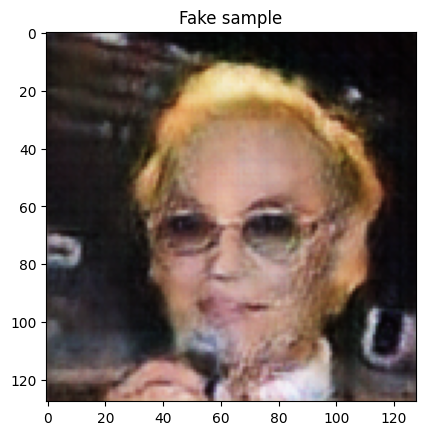

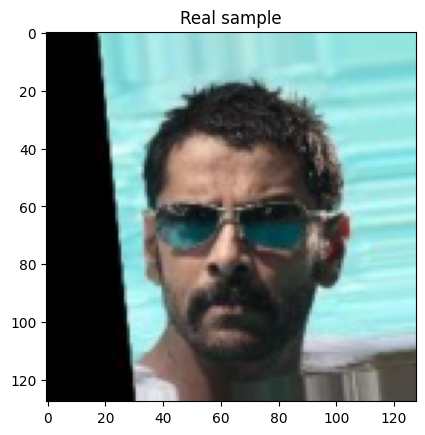

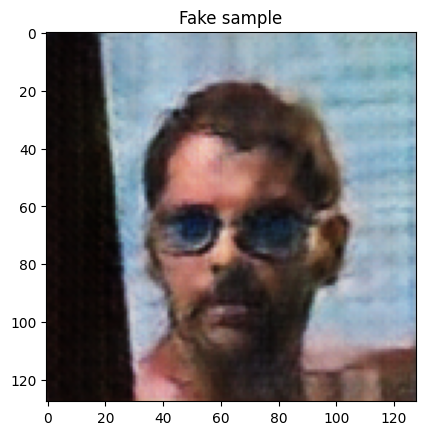

In [95]:
test_iter_X = iter(X_dataloader)
test_iter_Y = iter(Y_dataloader)


fixed_X = next(test_iter_X)
fixed_Y = next(test_iter_Y)
fixed_X = rescale(fixed_X) # make sure to scale to a range -1 to 1
fixed_Y = rescale(fixed_Y)
for fix_x , fix_y in zip(fixed_X , fixed_Y):
    save_samples(0, fix_y, fix_x, G_Y2X, G_X2Y, batch_size=1)

In [47]:
torch.save(G_X2Y.state_dict(),"generator.pth")